In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_absolute_error, mean_squared_error
import itertools
import statsmodels.tsa.stattools as ts
from sklearn.preprocessing import StandardScaler


In [2]:
# Read in targets
targets_df = pd.read_csv('targets.csv')
targets_df['Date'] = pd.to_datetime(targets_df['Date'])
targets_df.set_index('Date', inplace=True)

# Read in predictors
predictors_df = pd.read_csv('predictors.csv')
predictors_df['Date'] = pd.to_datetime(predictors_df['Date'])
predictors_df.set_index('Date', inplace=True)

# Merge targets and predictors
merged_df = targets_df.join(predictors_df)
print(merged_df)

                     SO2    Auto Gas  Manufacturing  Petrol Coal  \
Date                                                               
1980-01-01  9.442626e-07   80.378294      46.805149    88.803466   
1980-04-01  9.340424e-07   74.045325      45.293618    82.028254   
1980-07-01  9.258992e-07   73.681244      43.621773    80.131477   
1980-10-01  9.199498e-07   73.421459      45.854066    80.748748   
1981-01-01  9.140747e-07   73.734122      45.590844    79.559832   
...                  ...         ...            ...          ...   
2022-10-01  3.424376e-07   98.531831      99.729927    97.423327   
2023-01-01  3.424159e-07   95.767037      99.867739    93.966345   
2023-04-01  3.424292e-07  101.908704     100.835622   101.857295   
2023-07-01  3.424477e-07  101.979881      99.776331   103.262438   
2023-10-01  3.424376e-07  100.344378      99.520309   100.913921   

                   Profit  Working Population  
Date                                           
1980-01-01  206320.

In [3]:


def perform_multi_STL(df, features, y_label):

    # Create some subplots
    fig, axs = plt.subplots(4, 1, figsize=(11, 10))
    plt.rcParams.update({'axes.labelsize': 'large',
                         'axes.titlesize': 'small',
                         'legend.fontsize': 'large',
                         'xtick.labelsize': 'large',
                         'ytick.labelsize': 'large'})

    # Perform STL decomposition for each feature
    for feature in features:
        decomposition = seasonal_decompose(df[feature], model='multiplicative')

        # Plot observed
        axs[0].plot(decomposition.observed, label=feature)
        axs[0].set_title('Observed', fontsize=20)
        axs[0].set_ylabel(y_label)
        axs[0].legend(loc='upper left')

        # Plot trend
        axs[1].plot(decomposition.trend, label=feature)
        axs[1].set_title('Trend', fontsize=20)
        axs[1].set_ylabel(y_label)
        axs[1].legend(loc='upper left')

        # Plot seasonal
        axs[2].plot(decomposition.seasonal, label=feature)
        axs[2].set_title('Seasonal', fontsize=20)
        axs[2].set_ylabel(y_label)
        axs[2].legend(loc='upper left')

        # Plot residual
        axs[3].plot(decomposition.resid, label=feature)
        axs[3].set_title('Residual', fontsize=20)
        axs[3].set_xlabel('Date')
        axs[3].set_ylabel(y_label)
        axs[3].legend(loc='upper left')

    plt.suptitle('')
    plt.tight_layout()
    plt.show()


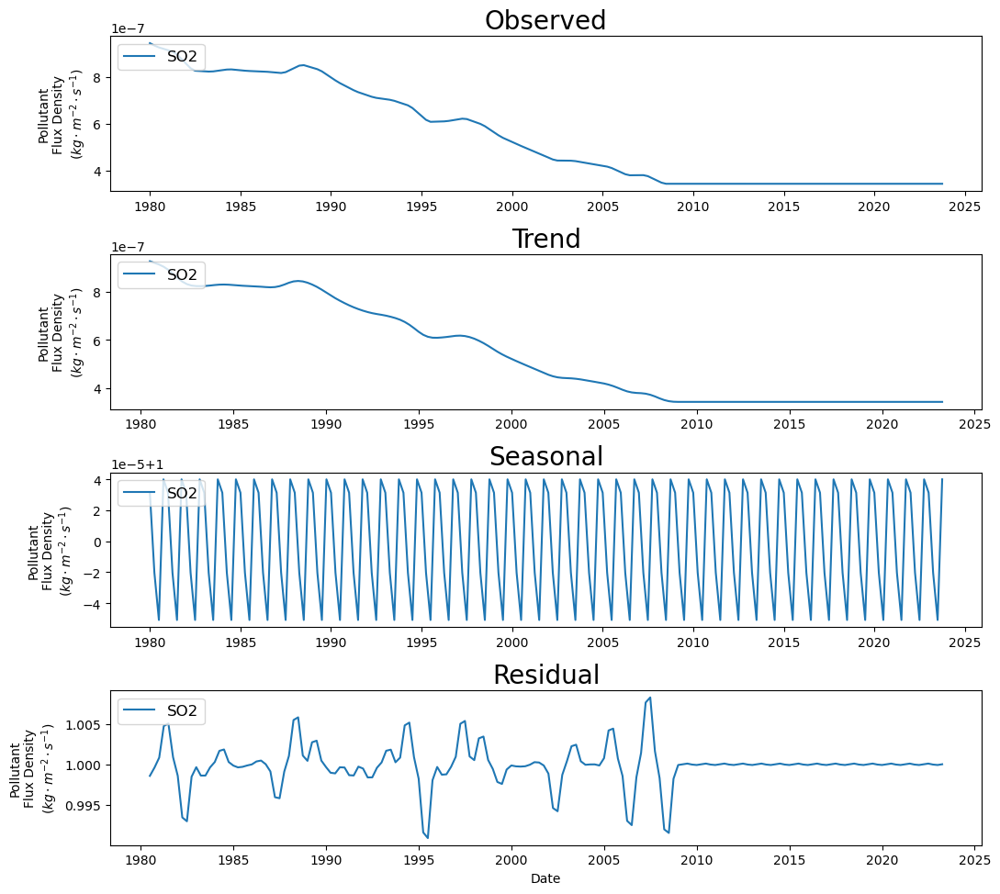

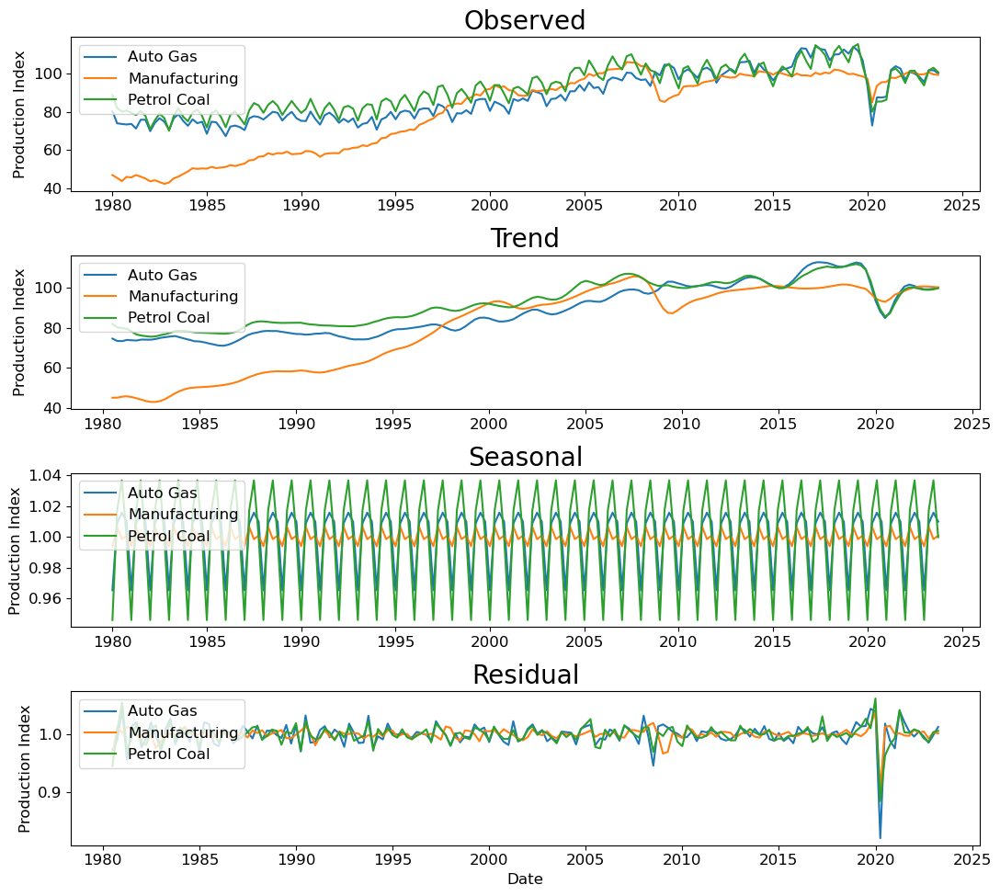

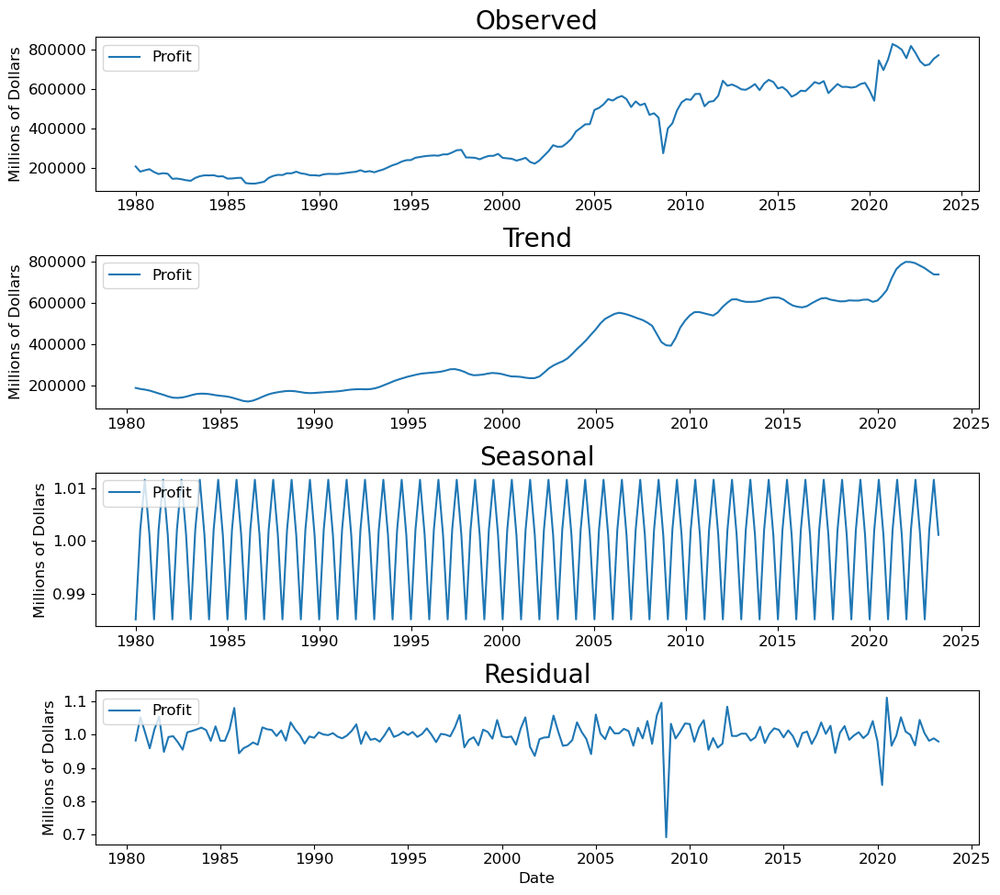

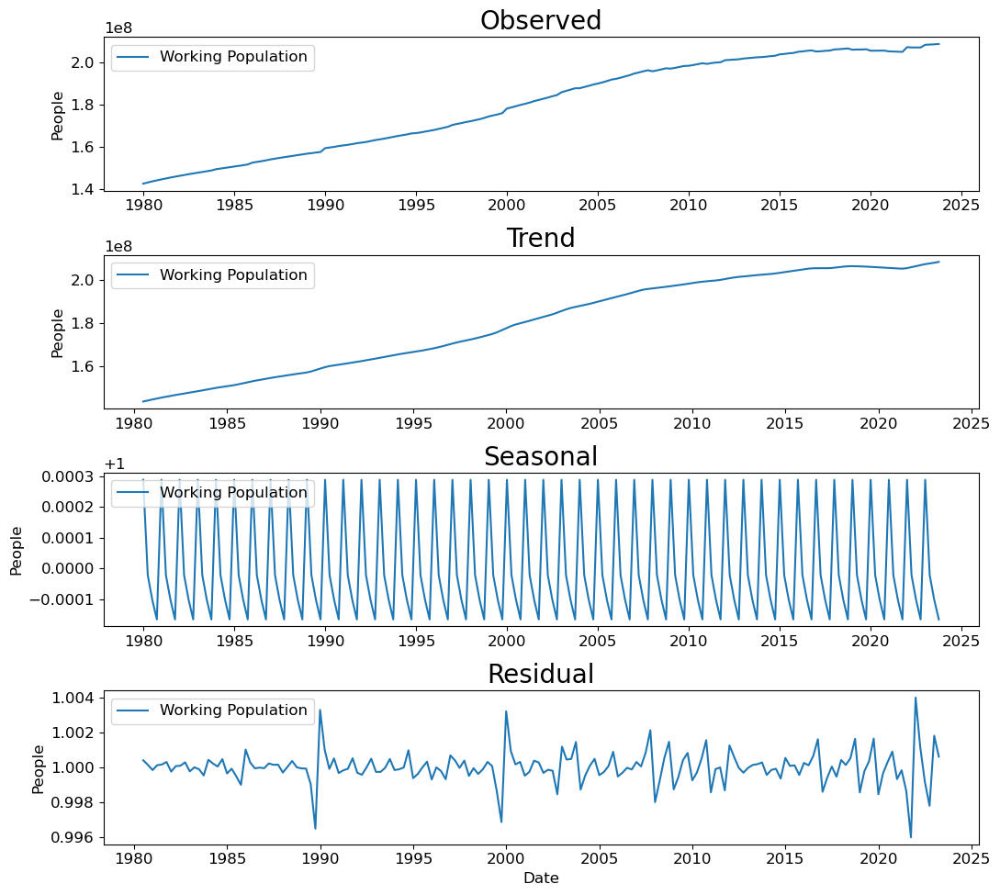

In [4]:
perform_multi_STL(merged_df, ['SO2'], 'Pollutant\nFlux Density\n($kg \cdot m^{-2} \cdot s^{-1}$)')
perform_multi_STL(predictors_df, ['Auto Gas', 'Manufacturing', 'Petrol Coal'],'Production Index')  
perform_multi_STL(predictors_df, ['Profit'], 'Millions of Dollars')             
perform_multi_STL(predictors_df, ['Working Population'], 'People') 



In [5]:

def check_stationarity(data, significance_level=0.05):
    # Use dicky fuller test 
    adf_result = ts.adfuller(data)
    
    # Obtain p-value
    p_value = adf_result[1]
    result = p_value < significance_level

    print("Is data stationary?", result)
    print("P-value:", p_value)
    return result, p_value

def AVERAGE(train_data, test_data):
    # Calculate mean of the training data
    mean = train_data.mean(axis=0)
    # Repeat the mean value for the test period for each column
    forecast = pd.DataFrame(np.repeat(mean.values.reshape(1, -1), len(test_data), axis=0), columns=test_data.columns, index=test_data.index)
    return forecast

def average_cv(SO2_train_df):    
    # Initialize best MAE and empty list to store accumulating MAE values
    best_mae = np.inf
    mae_values_for_params = []
    
    # Perform sliding window cross-validation with increasing window size
    for i in range(4, len(SO2_train_df)):                                           # i represents the end_index. Let's start at winddow size = 4 (Q4 of 1981)
        end_index = i

        # Forecast using average baseline average model
        train_SO2 = SO2_train_df.iloc[0:end_index]
        test_SO2 = SO2_train_df.iloc[end_index:]
        pred_SO2 = AVERAGE(train_SO2, test_SO2)
        # Calculate MAE
        mae = mean_absolute_error(test_SO2, pred_SO2) 
        mae_values_for_params.append(mae)
    # Calculate average MAE for the current parameter combination
    avg_mae_for_params = np.mean(mae_values_for_params)                             # Names are artifacts from reused code from sarimax_tuning_and_cv
    # Update best MAE and best parameters if current combination is better
    if avg_mae_for_params < best_mae:
        best_mae = avg_mae_for_params
        best_mae_values = mae_values_for_params
    return best_mae_values


def sarimax_tuning_and_cv(model_name, SO2_train_df, PC1_train_df=None):
    # Initialize best MAE and parameters (order and seasonal order)
    best_mae = np.inf
    best_params = None
    order_range = [(p, d, q) for p in range(2) for d in range(2) for q in range(2)]

    seasonal_order_range = [
        (0, 0, 0, 0),
        (0, 0, 1, 4),
        (1, 0, 0, 4),
        (1, 0, 1, 4),
        (0, 0, 0, 4),
    ]

    # For each combination of parameters, perfor rolling-window cross-validation
    for order in order_range:
        for seasonal_order in seasonal_order_range:
            # Initialize list to store MAE values for each window
            mae_values_for_params = []
            
            # Perform rolling window cross-validation with increasing window size
            for i in range(4, len(SO2_train_df)):                                     # i represents the end_index. Let's start at winddow size = 4 (Q4 of 1981)
                end_index = i

            # Forecast using appropriate model. Use exogenous variable if SARIMAX. 
                if model_name == 'SARIMA':
                # Extract data within current window
                    train_SO2 = SO2_train_df.iloc[0:end_index]
                    model = SARIMAX(train_SO2, order=order, seasonal_order=seasonal_order)
                    fitted_model = model.fit(disp=False)                
                    pred_SO2 = fitted_model.predict(start=train_SO2.index[0], end=train_SO2.index[-1])

                elif model_name == 'SARIMAX':
                    # Extract data within current window
                    train_SO2 = SO2_train_df.iloc[0:end_index]
                    train_PC1 = PC1_train_df.iloc[0:end_index]
                    model = SARIMAX(train_SO2, exog=train_PC1, order=order, seasonal_order=seasonal_order)
                    fitted_model = model.fit(disp=False)                
                    pred_SO2 = fitted_model.predict(start=train_SO2.index[0], end=train_SO2.index[-1], exog=train_PC1)
                
                # Calculate MAE
                mae = mean_absolute_error(train_SO2, pred_SO2) 
                mae_values_for_params.append(mae)
            
            # Calculate average MAE for the current parameter combination
            avg_mae_for_params = np.mean(mae_values_for_params)
            
            # Update best MAE and best parameters if current combination is better
            if avg_mae_for_params < best_mae:
                best_mae = avg_mae_for_params
                best_params = {'order': order, 'seasonal_order': seasonal_order}
                best_mae_values = mae_values_for_params
    return order, seasonal_order, best_mae_values



def evaluate_exmodel_metrics(model_name, train_data, test_data, exog_train=None, exog_test=None, order=None, seasonal_order=None):
    # Training Phase
    if model_name == 'SARIMA':
        model = SARIMAX(train_data, order=order, seasonal_order=seasonal_order,
                        enforce_stationarity=False, enforce_invertibility=False)
        fitted_model = model.fit(disp=False)
        
        # Testing Phase
        forecast = fitted_model.forecast(steps=len(test_data))  # Forecast endogenous variable only

    # Training Phase
    if model_name == 'SARIMAX':
        model = SARIMAX(train_data, exog=exog_train, order=order, seasonal_order=seasonal_order,
                        enforce_stationarity=False, enforce_invertibility=False)
        fitted_model = model.fit(disp=False)
        
        # Testing Phase
        forecast = fitted_model.forecast(steps=len(test_data), exog=exog_test)  # Forecast endogenous variable only
        feature_coeffs = fitted_model.params[-len(exog_test):]  # Extract coefficients for exogenous variables

    if model_name == 'AVERAGE':

        # Training & testing
        forecast = AVERAGE(train_data, test_data)
        forecast = forecast['SO2']

    # Calculate evaluation metrics
    test_series = test_data.squeeze()                                                                               # Convert the test_df to a series to prevent df full of nan values for MASE

    mae = mean_absolute_error(test_series, forecast)
    rmse = np.sqrt(mean_squared_error(test_series, forecast))
    # mape = mean_absolute_percentage_error(test_series, forecast)                                                  # unstable due to values close to 0! As seen in Bagrow's notes. Let's use MAE instead.
    mase = np.mean(np.abs(test_series - forecast)) / np.mean(np.abs(test_series.diff().dropna()))

    if model_name == 'SARIMA' or model_name == 'AVERAGE':
        return mae, rmse, mase, forecast
    elif model_name == 'SARIMAX':
        return mae, rmse, mase, forecast, feature_coeffs



In [6]:

check_stationarity(merged_df['SO2'])
# Define the range of differencing orders to try
max_diff_order = 100 
# Start from 1 to avoid differencing with zero periods
for i in range(1, max_diff_order + 1):  
    data_diff = merged_df['SO2'].diff(periods=i).dropna()
    dftest = ts.adfuller(data_diff, autolag='AIC')
    print(f"Differencing Order: {i}")
    print("ADF Statistic:", dftest[0])
    print("p-value:", dftest[1])
    
    if dftest[1] <= 0.05:
        print(f"Stationary at differencing order {i}")
        # Exit loop once we find the stationar differencing order
        break  


def detrend_data(df, features):
    # Create an empty DataFrame to store detrended data
    detrended_df = pd.DataFrame(index=df.index)  
    
    for feature in features:
        decomposition = seasonal_decompose(df[feature], model='multiplicative', extrapolate_trend='freq')
        detrended_df[feature] = df[feature] - decomposition.trend
    return detrended_df



Is data stationary? False
P-value: 0.48686104836942823
Differencing Order: 1
ADF Statistic: -1.8109693285547068
p-value: 0.3750294863057696
Differencing Order: 2
ADF Statistic: -1.770602570078287
p-value: 0.39515124707825594
Differencing Order: 3
ADF Statistic: -1.5759638838773118
p-value: 0.4956553764517644
Differencing Order: 4
ADF Statistic: -1.601729142517058
p-value: 0.4827248073622845
Differencing Order: 5
ADF Statistic: -1.6261518489173046
p-value: 0.46950562296217846
Differencing Order: 6
ADF Statistic: -1.7569155282661657
p-value: 0.4020518294727689
Differencing Order: 7
ADF Statistic: -1.6095463339661915
p-value: 0.4787964942908776
Differencing Order: 8
ADF Statistic: -1.5431787119982523
p-value: 0.512053689534282
Differencing Order: 9
ADF Statistic: -1.8070810920017115
p-value: 0.3769518383623728
Differencing Order: 10
ADF Statistic: -1.8961828288042901
p-value: 0.3338589538836023
Differencing Order: 11
ADF Statistic: -1.704284925716789
p-value: 0.4289061175230737
Differenci

In [7]:

def split_data(all_data, split_date):
    train_data = all_data.loc[all_data.index < split_date]
    test_data = all_data.loc[all_data.index >= split_date]       
    return train_data, test_data

def standardize_data(train_df, test_df):
    scaler = StandardScaler()
    train_scaled_array = scaler.fit_transform(train_df)
    test_scaled_array = scaler.transform(test_df)  # Use transform for test set
    # Convert scaled arrays back to DataFrames
    train_scaled_df = pd.DataFrame(train_scaled_array, index=train_df.index, columns=train_df.columns)
    test_scaled_df = pd.DataFrame(test_scaled_array, index=test_df.index, columns=test_df.columns)
    return train_scaled_df, test_scaled_df


def get_correlation_matrix(exog_train_scaled_df):
    correlation_matrix = exog_train_scaled_df.corr()
    # Plot heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 12})
    # plt.title('Correlation Matrix', fontsize=16)
    plt.show()


def plot_forecast(SO2, SO2_test, forecast):
    # Plotting entire time series and nowcast line
    plt.figure(figsize=(12, 8))

    # Subplot for entire time series
    plt.subplot(2, 1, 1)
    plt.plot(SO2.index, SO2['SO2'], label='SO2')
    plt.plot(SO2_test.index, forecast, color='red', linestyle='--', label='Nowcasted SO2')
    plt.title('Nowcasted SO2 Emissions', fontsize=15)
    plt.xlabel('Date', fontsize=15)
    plt.ylabel('SO2 (Scaled)', fontsize=15)
    plt.legend(fontsize=12)
    plt.grid(True)

    # Subplot for forecasted range
    plt.subplot(2, 1, 2)
    plt.plot(SO2_test.index, SO2_test['SO2'], label='SO2')
    plt.plot(SO2_test.index, forecast, color='red', linestyle='--', label='Nowcasted SO2')
    plt.title('Nowcasted SO2 Emissions (Zoom)', fontsize=15)
    plt.xlabel('Date', fontsize=15)
    plt.ylabel('SO2 (Scaled)', fontsize=15)
    plt.legend(fontsize=12)
    plt.grid(True)

    plt.tight_layout()
    plt.show()


def plot_MAE(MAE_values):
    window_sizes=[i for i in range(4,len(MAE_values)+4)]
    # Subplot for entire time series of rolling window sizes. Start at Q4 1981
    plt.subplot(2, 1, 1)
    plt.plot(window_sizes,MAE_values, label='MAE')                     
    plt.title('MAE vs Window Size')
    plt.xlabel('Window Size')
    plt.ylabel('MAE')
    plt.legend()
    plt.grid(True)


def format_metrics_to_latex(mae, rmse, mase):
    latex_table = f"""
    \\begin{{table}}[h]
    \\centering
    \\begin{{tabular}}{{|c|c|}}
    \\hline
    Metric & Value \\\\
    \\hline
    MAE & {mae:.4e} \\\\
    RMSE & {rmse:.4e} \\\\
    MASE & {mase:.4e} \\\\
    \\hline
    \\end{{tabular}}
    \\caption{{Evaluation Metrics}}
    \\label{{tab:metrics}}
    \\end{{table}}
    """
    return latex_table

In [8]:
def get_train_test(merged_df, split_date, truncated=False):

    if truncated==True:
        merged_df = merged_df.loc[merged_df.index < '2008-01-01']

    
    SO2 = merged_df[['SO2']].copy()                                                 # get initial so2_all
    SO2_train, SO2_test = split_data(SO2, split_date)                               # split so2 
    SO2_detrend_train = detrend_data(SO2_train, SO2_train.columns)                  # detrend so2 train
    SO2_detrend_test = detrend_data(SO2_test, SO2_train.columns)                    # detrend so2 test
    SO2_train, SO2_test = standardize_data(SO2_detrend_train, SO2_detrend_test)     # standardize so2_train and so2_test using the so2_train scale  (we scale it because the initial scale is incredibly small
                                                                                                                                                    # relative to that of the scaled exog data)
    SO2 = pd.concat([SO2_train, SO2_test])                                                        # combine SO2_train and SO2_test for the nowcast plot later. 
                                                                                             
    
    exog = merged_df.drop(columns=['SO2'])                                          # get initial exog_all
    exog_train, exog_test = split_data(exog, split_date)                            # split exog
    exog_detrend_train = detrend_data(exog_train, exog_train.columns)               # detrend exog train
    exog_detrend_test = detrend_data(exog_test, exog_train.columns)                 # detrend exog test
    exog_train, exog_test = standardize_data(exog_detrend_train, exog_detrend_test) # standardize exog train and exog test using exog train scale

    if truncated == False:
        get_correlation_matrix(exog_train)                                                            # Not highly correlated, so we don't do a PCA. 

    # Since Correlation matrix shows Auto Gas and Petrol Coal are highly correlated, we're going to drop Auto Gas. We do this because Petroleum and Coal manufacturing produces more SO2. 
    exog_train = exog_train.drop(columns=['Auto Gas'])     # use as exogenous training data going forward
    exog_test = exog_test.drop(columns=['Auto Gas'])       # use as exogenous testing data going forward

    if truncated == False:
        get_correlation_matrix(exog_train) 
    return SO2, SO2_train, SO2_test, exog_train, exog_test


# Untruncated (2015 Split).

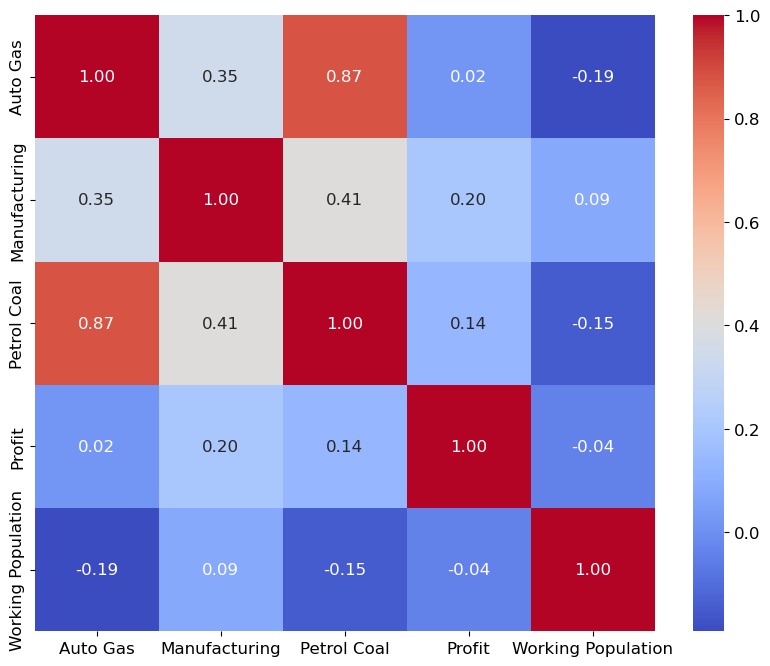

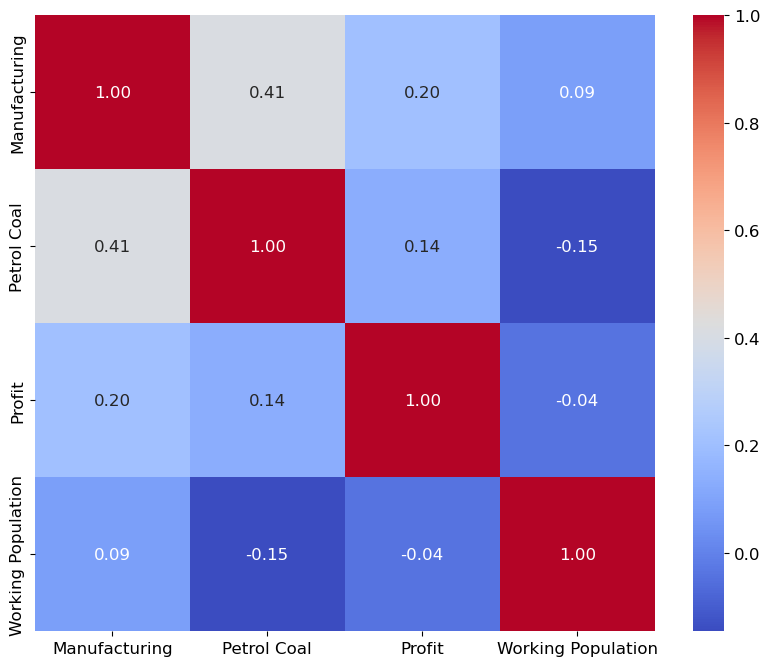

Is data stationary? True
P-value: 8.775440667980063e-07


/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)
/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)
/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)
/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)
/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.p

order =  (1, 1, 1)


seasonal order =  (0, 0, 0, 4)


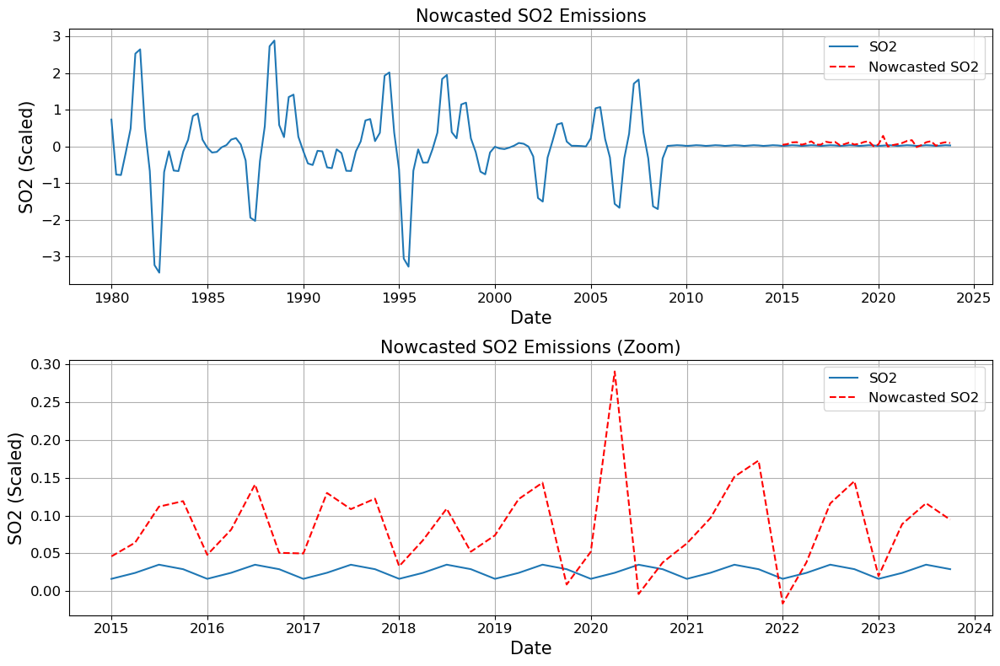


    \begin{table}[h]
    \centering
    \begin{tabular}{|c|c|}
    \hline
    Metric & Value \\
    \hline
    MAE & 6.6316e-02 \\
    RMSE & 8.2296e-02 \\
    MASE & 7.1617e+00 \\
    \hline
    \end{tabular}
    \caption{Evaluation Metrics}
    \label{tab:metrics}
    \end{table}
    
feature_coeffs
Manufacturing        -0.019412
Petrol Coal           0.033114
Profit               -0.010809
Working Population   -0.013303
ar.L1                -0.123793
ma.L1                 1.000012
sigma2                0.383928
dtype: float64


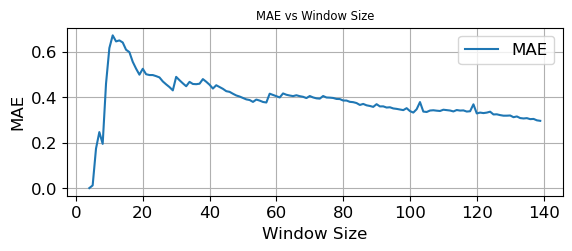

In [9]:
# SARIMAX (2015 split)
SO2, SO2_train, SO2_test, exog_train, exog_test = get_train_test(merged_df, '2015-01-01')
check_stationarity(SO2)
order, seasonal_order, MAE_values = sarimax_tuning_and_cv('SARIMAX', SO2_train, exog_train) 
print('order = ', order)
print('\n')
print('seasonal order = ', seasonal_order)
# Use SARIMAX
mae, rmse, mase, forecast, feature_coeffs = evaluate_exmodel_metrics('SARIMAX', SO2_train, SO2_test, exog_train=exog_train, exog_test=exog_test, order=order, seasonal_order=seasonal_order)
plot_forecast(SO2, SO2_test, forecast)
plot_MAE(MAE_values)
metrics_table = format_metrics_to_latex(mae, rmse, mase)
print(metrics_table)
# Print out feature coefficients
print('feature_coeffs')
print(feature_coeffs)


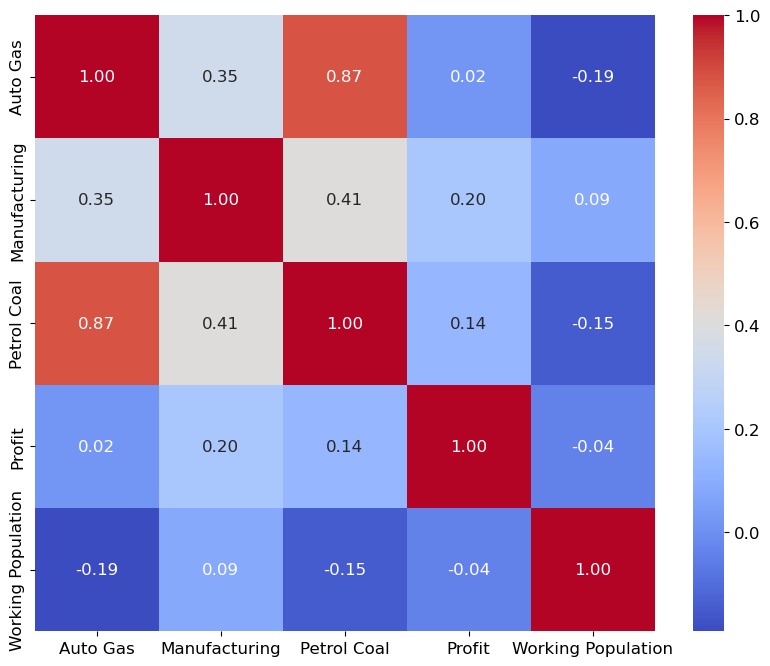

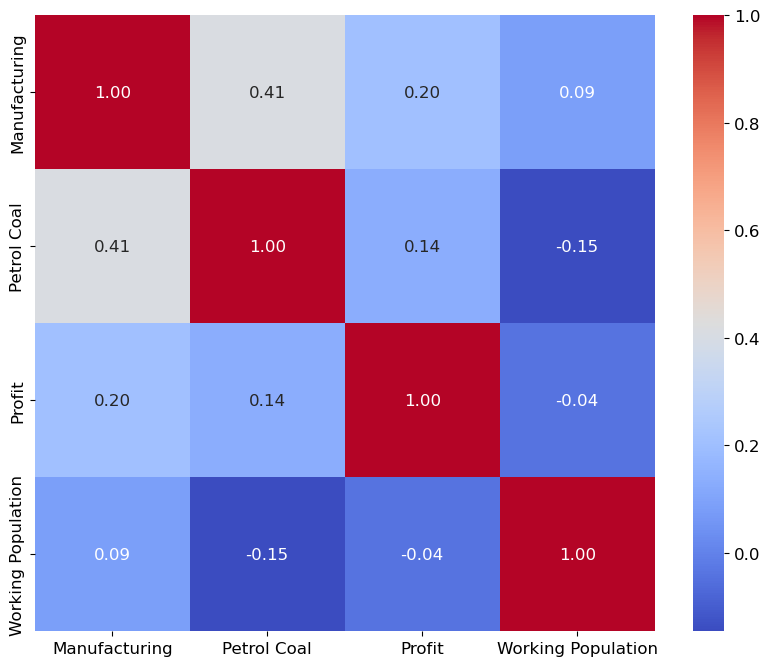

Is data stationary? True
P-value: 8.775440667980063e-07


/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)
/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)
/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)
/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)
/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.p

order =  (1, 1, 1)


seasonal order =  (0, 0, 0, 4)


/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)
/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)


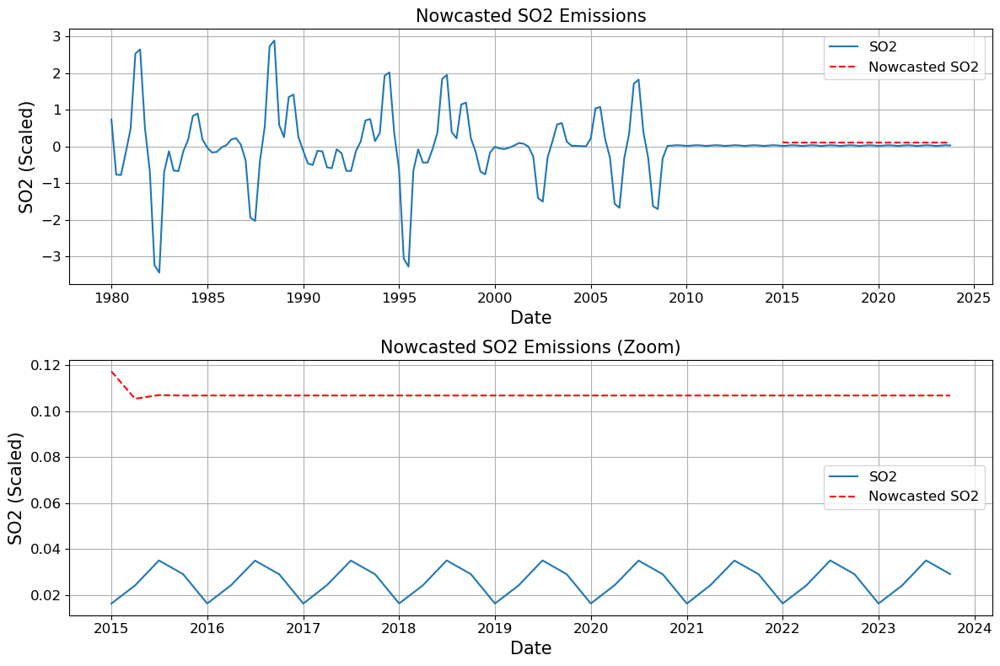


    \begin{table}[h]
    \centering
    \begin{tabular}{|c|c|}
    \hline
    Metric & Value \\
    \hline
    MAE & 8.0924e-02 \\
    RMSE & 8.1266e-02 \\
    MASE & 8.7393e+00 \\
    \hline
    \end{tabular}
    \caption{Evaluation Metrics}
    \label{tab:metrics}
    \end{table}
    


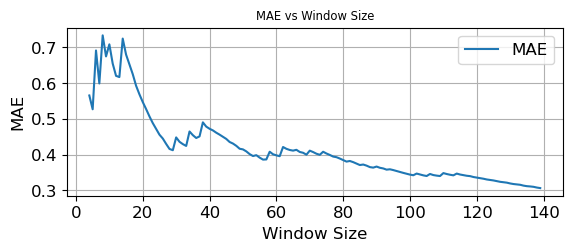

In [10]:
# SARIMA (2015 split)
SO2, SO2_train, SO2_test, exog_train, exog_test = get_train_test(merged_df, '2015-01-01')
check_stationarity(SO2)
order, seasonal_order, MAE_values = sarimax_tuning_and_cv('SARIMA', SO2_train) 
print('order = ', order)
print('\n')
print('seasonal order = ', seasonal_order)

# Use SARIMA
mae, rmse, mase, forecast = evaluate_exmodel_metrics('SARIMA', SO2_train, SO2_test, order=order, seasonal_order=seasonal_order)
plot_forecast(SO2, SO2_test, forecast)
plot_MAE(MAE_values)
metrics_table = format_metrics_to_latex(mae, rmse, mase)
print(metrics_table)

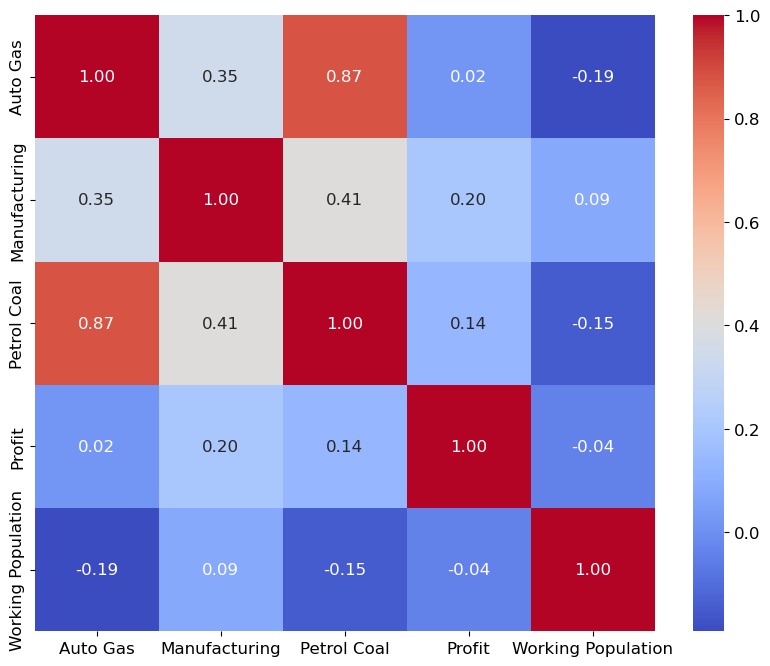

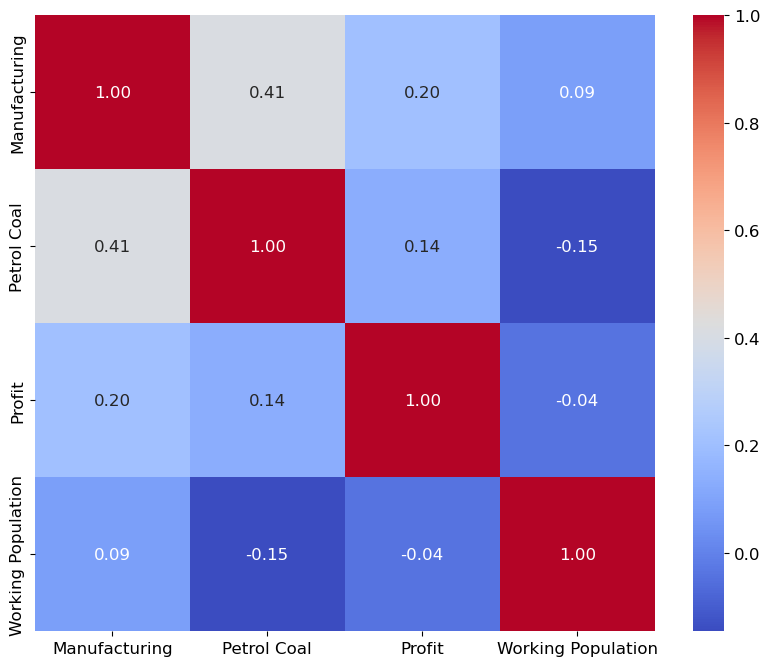

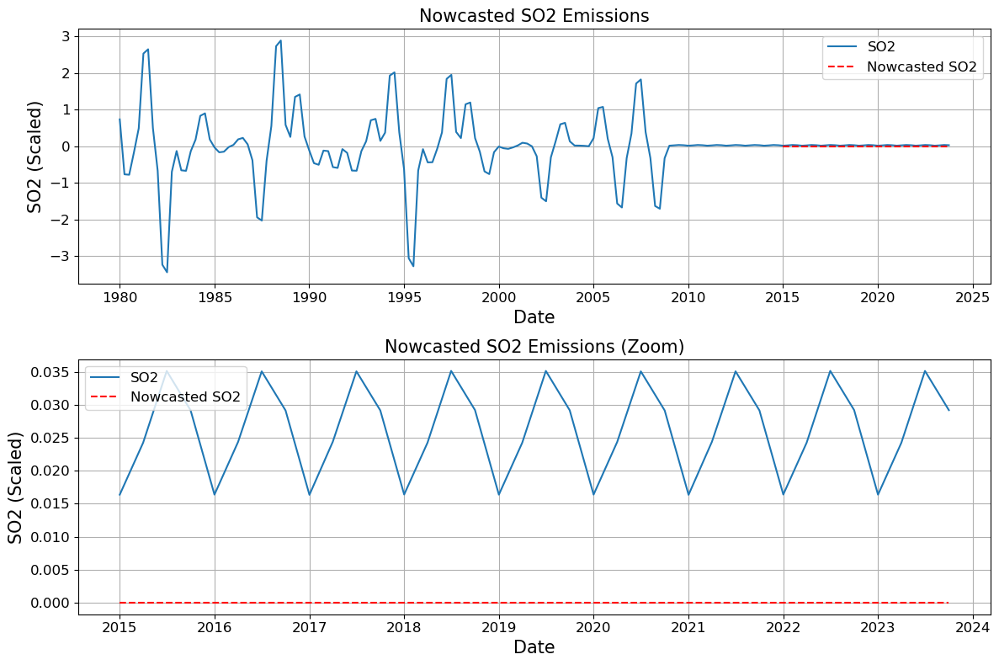


    \begin{table}[h]
    \centering
    \begin{tabular}{|c|c|}
    \hline
    Metric & Value \\
    \hline
    MAE & 2.6221e-02 \\
    RMSE & 2.7102e-02 \\
    MASE & 2.8317e+00 \\
    \hline
    \end{tabular}
    \caption{Evaluation Metrics}
    \label{tab:metrics}
    \end{table}
    


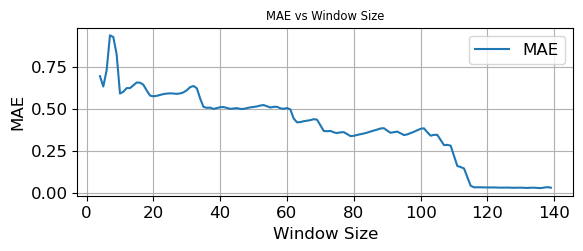

In [11]:
# AVERAGE (2015 split)
SO2, SO2_train, SO2_test, exog_train, exog_test = get_train_test(merged_df, '2015-01-01')
MAE_values = average_cv(SO2_train) 

# Use AVERAGE
mae, rmse, mase, forecast = evaluate_exmodel_metrics('AVERAGE', SO2_train, SO2_test)
plot_forecast(SO2, SO2_test, forecast)
plot_MAE(MAE_values)
metrics_table = format_metrics_to_latex(mae, rmse, mase)
print(metrics_table)

# Truncated (2003 Split)

Is data stationary? True
P-value: 2.364466783930812e-10


/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)
/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)
/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)
/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/b

order =  (1, 1, 1)


seasonal order =  (0, 0, 0, 4)


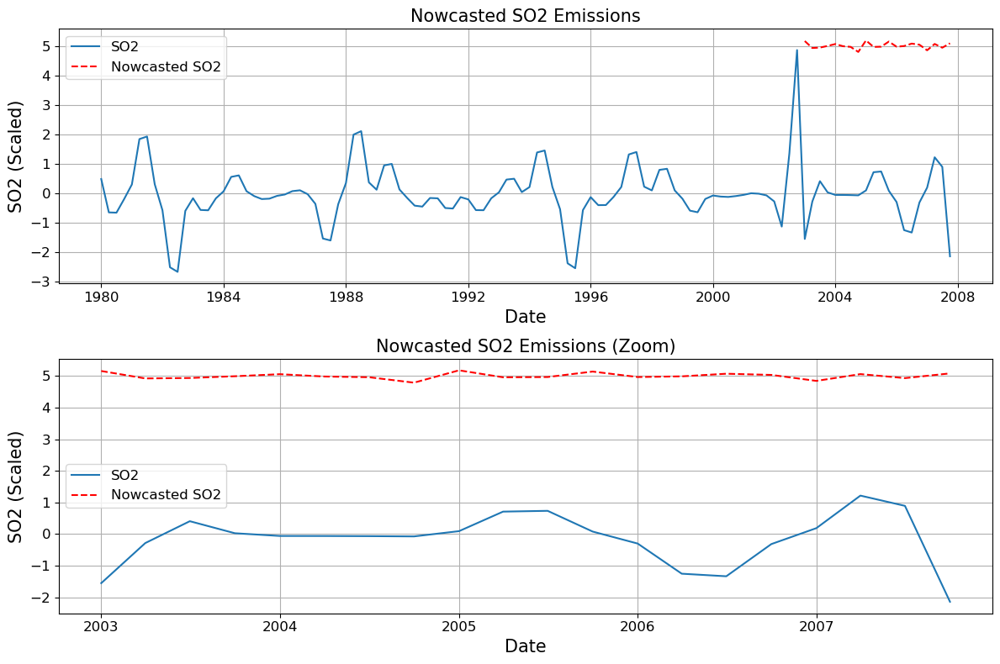


    \begin{table}[h]
    \centering
    \begin{tabular}{|c|c|}
    \hline
    Metric & Value \\
    \hline
    MAE & 5.1599e+00 \\
    RMSE & 5.2318e+00 \\
    MASE & 8.7254e+00 \\
    \hline
    \end{tabular}
    \caption{Evaluation Metrics}
    \label{tab:metrics}
    \end{table}
    
feature_coeffs
Manufacturing        -0.001158
Petrol Coal          -0.025466
Profit                0.077565
Working Population    0.029861
ar.L1                -0.091806
ma.L1                 1.000027
sigma2                0.372844
dtype: float64


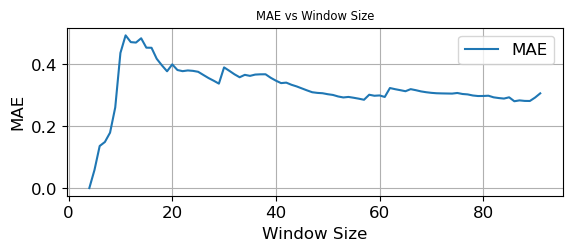

In [12]:
# SARIMAX (2003 split)
SO2, SO2_train, SO2_test, exog_train, exog_test = get_train_test(merged_df, '2003-01-01', truncated=True)
check_stationarity(SO2)
order, seasonal_order, MAE_values = sarimax_tuning_and_cv('SARIMAX', SO2_train, exog_train) 
print('order = ', order)
print('\n')
print('seasonal order = ', seasonal_order)
# Use SARIMAX
mae, rmse, mase, forecast, feature_coeffs = evaluate_exmodel_metrics('SARIMAX', SO2_train, SO2_test, exog_train=exog_train, exog_test=exog_test, order=order, seasonal_order=seasonal_order)
plot_forecast(SO2, SO2_test, forecast)
plot_MAE(MAE_values)
metrics_table = format_metrics_to_latex(mae, rmse, mase)
print(metrics_table)
# Print out feature coefficients
print('feature_coeffs')
print(feature_coeffs)

Is data stationary? True
P-value: 2.364466783930812e-10


/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)
/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)
/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)
/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency QS-OCT will be used.
  self._init_dates(dates, freq)
/Users/kevinmotia/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.p

order =  (1, 1, 1)


seasonal order =  (0, 0, 0, 4)


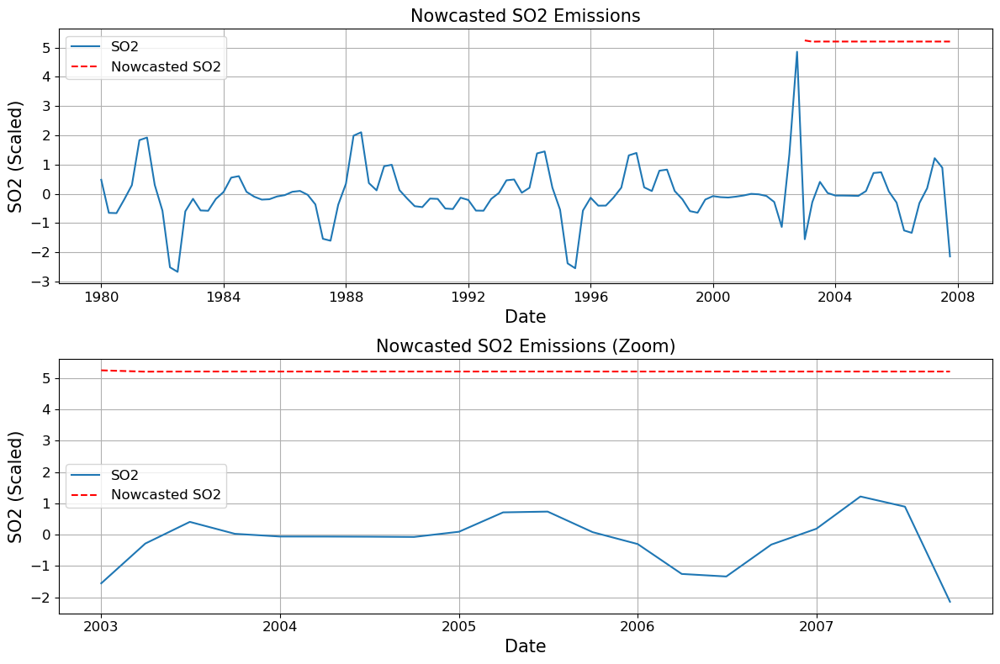


    \begin{table}[h]
    \centering
    \begin{tabular}{|c|c|}
    \hline
    Metric & Value \\
    \hline
    MAE & 5.3634e+00 \\
    RMSE & 5.4274e+00 \\
    MASE & 9.0695e+00 \\
    \hline
    \end{tabular}
    \caption{Evaluation Metrics}
    \label{tab:metrics}
    \end{table}
    


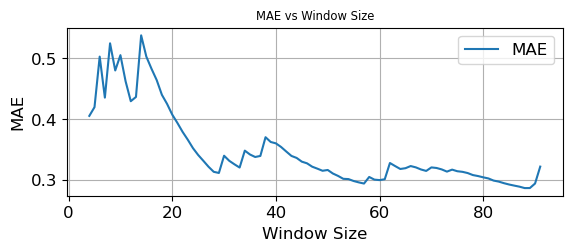

In [13]:
# SARIMA (2003 split)
SO2, SO2_train, SO2_test, exog_train, exog_test = get_train_test(merged_df, '2003-01-01', truncated=True)
check_stationarity(SO2)
order, seasonal_order, MAE_values = sarimax_tuning_and_cv('SARIMA', SO2_train) 
print('order = ', order)
print('\n')
print('seasonal order = ', seasonal_order)

# Use SARIMA
mae, rmse, mase, forecast = evaluate_exmodel_metrics('SARIMA', SO2_train, SO2_test, order=order, seasonal_order=seasonal_order)
plot_forecast(SO2, SO2_test, forecast)
plot_MAE(MAE_values)
metrics_table = format_metrics_to_latex(mae, rmse, mase)
print(metrics_table)

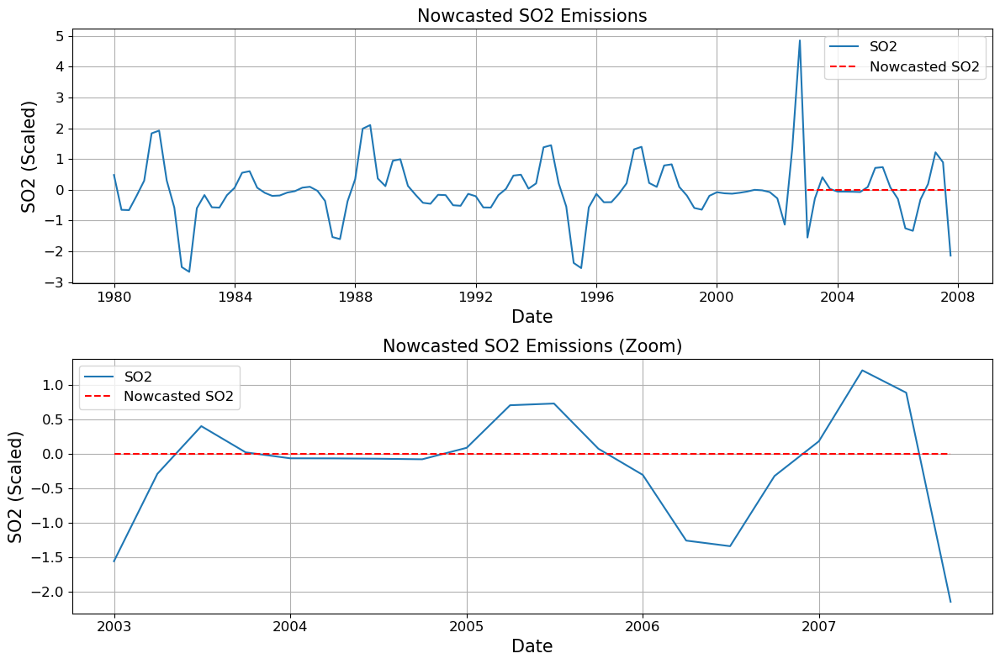


    \begin{table}[h]
    \centering
    \begin{tabular}{|c|c|}
    \hline
    Metric & Value \\
    \hline
    MAE & 5.8988e-01 \\
    RMSE & 8.4234e-01 \\
    MASE & 9.9749e-01 \\
    \hline
    \end{tabular}
    \caption{Evaluation Metrics}
    \label{tab:metrics}
    \end{table}
    


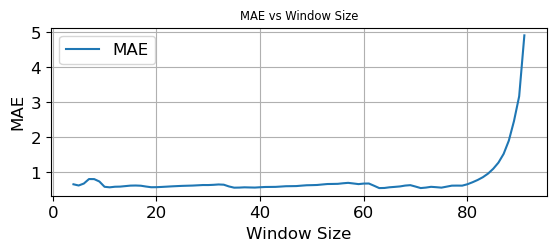

In [14]:
# AVERAGE (2003 split)
SO2, SO2_train, SO2_test, exog_train, exog_test = get_train_test(merged_df, '2003-01-01', truncated=True)
MAE_values = average_cv(SO2_train) 

# Use AVERAGE
mae, rmse, mase, forecast = evaluate_exmodel_metrics('AVERAGE', SO2_train, SO2_test)
plot_forecast(SO2, SO2_test, forecast)
plot_MAE(MAE_values)
metrics_table = format_metrics_to_latex(mae, rmse, mase)
print(metrics_table)
